# Reference: This notebook used code from:
https://www.kaggle.com/code/imoore/generate-paintings-by-image-style-transfer
# Image dataset from:
https://www.kaggle.com/datasets/balraj98/monet2photo
# VGG19
Each layer of the neural network uses the output of the previous layer to further extract more complex features until it is complex enough to be used for object recognition, so each layer can be viewed as an extractor of many local features that can be used as local feature extraction.

# Step 1: set up environment

In [1]:
import tensorflow as tf # Importing the TensorFlow library

In [2]:
!pip install matplotlib

In [3]:
import matplotlib.pyplot as plt # Imported the pyplot module from the Matplotlib library and named it plt

In [4]:
import numpy as np # imported the NumPy library and named it np

In [5]:
import time # Imported the time module from the Python standard library.

In [6]:
from PIL import Image # Importing the Image module from the PIL library
%matplotlib inline

# Step 2: load image

In [7]:
# A function to load the input images and set its dimensions to 1024 x 768
def load_image(image_path):
    max_dim=512  # The maximum dimension is set to 512
    img = tf.io.read_file(image_path)  # Reads the contents of an image file from the specified image_path and stores it in the img variable.
    img = tf.image.decode_image(img, channels=3)# Decode the image data in img into a tensor
    img = tf.image.convert_image_dtype(img, tf.float32) # Convert the image data type in img to tf.float32

    shape = tf.cast(tf.shape(img)[:-1], tf.float32) # Get the shape of the img tensor and convert it to tf.float32 via tf.cast
    long_dim = max(shape) # The long side of the image was calculated
    scale = max_dim / long_dim # A scaling ratio was calculated to resize the image to a maximum dimension of max_dim
    new_shape = tf.cast(shape * scale, tf.int32) # New image shapes were calculated

    img = tf.image.resize(img, new_shape) # Adjusting an image to a new shape
    img = img[tf.newaxis, :]# broadcasting the image array so that it has a batch dimension

    return img

In [8]:
def imshow(image, title=None): # A function called imshow is defined
    if(len(image.shape) > 3):# suppose dim is like 1,2,4,2,2,1... it removes the ones so that only 3 values remain W,H,c
        image=np.squeeze(image, axis=0) # Remove axes of dimension 1 using the np.squeeze function
    plt.imshow(image)
    if(title):# if there's a title mention it
        plt.title(title)

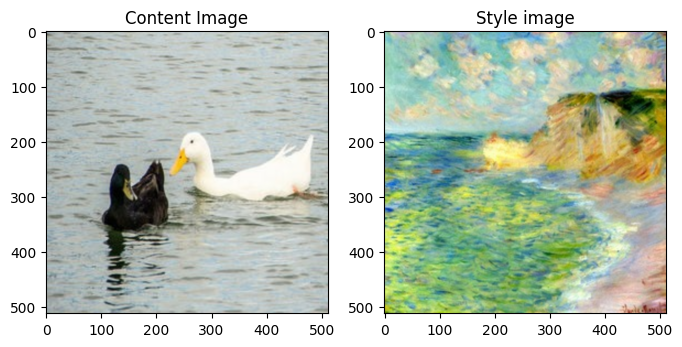

In [9]:
# The function of these code is to visualize images
content_img=load_image(r'C:\Users\shao\Desktop\image dataset\content image\content image1.jpeg')# the path towards content image
style_img=load_image(r'C:\Users\shao\Desktop\image dataset\style image\style image1.jpeg')# the path towards style image

plt.figure(figsize=(8,8))
plt.subplot(1, 2, 1)
imshow(content_img, 'Content Image')
plt.subplot(1, 2, 2)
imshow(style_img, 'Style image')

In [10]:
print(content_img.shape)
print(style_img.shape)

(1, 512, 512, 3)
(1, 512, 512, 3)


In [11]:
# Define the content image representation and load the model
x=tf.keras.applications.vgg19.preprocess_input(content_img*255)# needs preprocessing for the model to be initialized
x=tf.image.resize(x, (256,256))# the vgg19 model takes images in 256
vgg_model=tf.keras.applications.VGG19(include_top=False, weights='imagenet') # weights='imagenet' indicates the use of weights pre-trained on the ImageNet dataset
vgg_model.trainable=False # Set the trainable parameter of vgg_model to False
vgg_model.summary()



Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0   

In [12]:
# Chooose the content and style layers
content_layers=['block4_conv2']
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

In [13]:
# Build the model
def my_model(layer_names):
    # Retrieve the output layers corresponding to the content and style layers
    vgg_model = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg_model.trainable = False
    outputs = [vgg_model.get_layer(name).output for name in layer_names] # The output of the corresponding layer from the VGG19 model is extracted based on the name of the layer in the layer_names list, using the list derivation style
    model=tf.keras.Model([vgg_model.input], outputs)
    return model

In [14]:
style_extractor = my_model(style_layers) # This model uses some of the layers of VGG19 as an output layer for extracting features of the stylised image
style_outputs = style_extractor(style_img*255) # Input style image style_img into style_extractor model

In [15]:
# Compute the gram matrix
# Einsum allows defining Tensors by defining their element-wise computation.
# This computation is defined by equation, a shorthand form based on Einstein summation.
def gram_matrix(input_tensor): # input_tensor is of shape ch, n_H, n_W
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32) # Unrolls n_H and n_W
    return result/(num_locations)

In [16]:
class entire_model(tf.keras.models.Model): # A class called entire_model is defined
    def __init__(self, style_layers, content_layers):
        super(entire_model, self).__init__()
        self.vgg=my_model(style_layers + content_layers) # A VGG19 model is created, containing the layers specified in style_layers and content_layers, and assigned to the class property self.vgg
        self.style_layers=style_layers
        self.content_layers=content_layers
        self.num_style_layers=len(style_layers) # The length of the style_layers list is calculated
        self.vgg.trainable=False

    def call(self, inputs):
        inputs=inputs*255.0 # Scale back the pixel values
        preprocessed_input=tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs=self.vgg(preprocessed_input)# Pass the preprocessed input to my_model

        # Separate the representations of style and content
        style_outputs, content_outputs=(outputs[:self.num_style_layers], outputs[self.num_style_layers:])
        # Calculate the gram matrix for each layer in the style output. This will be the final style representation
        style_outputs=[gram_matrix(layer) for layer in style_outputs]

        # Store the content and style representation in dictionaries in a layer by layer manner
        content_dict = {content_name:value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}
        style_dict = {style_name:value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

        return {'content': content_dict, 'style': style_dict}
        # Returns a dict of dicts with content and style representations, i.e., gram matrix of the style_layers and
        # the content of the content_layers

In [17]:
# Now we extract the style and content features by calling the above class
extractor=entire_model(style_layers, content_layers)
style_targets = extractor(style_img)['style']
content_targets = extractor(content_img)['content']

results = extractor(tf.constant(content_img)) # The extractor model is called and the content image content_img is passed to the model

In [18]:
style_weight=40
content_weight=10

# Custom weights for different style layers
style_weights = {'block1_conv1': 0.4,
                 'block2_conv1': 0.15,
                 'block3_conv1': 0.25,
                 'block4_conv1': 0.15,
                 'block5_conv1': 0.05}
# style_weights = {'block1_conv1': 0.3,
#                  'block2_conv1': 0.45,
#                  'block3_conv1': 0.15,
#                  'block4_conv1': 0.05,
#                  'block5_conv1': 0.05}

In [19]:
def total_cost(outputs): # defines a function called total_cost that takes one argument outputs
    style_outputs=outputs['style']
    content_outputs=outputs['content']
    style_loss=tf.add_n([style_weights[name]*tf.reduce_mean((style_outputs[name]-style_targets[name])**2) # By weighting the output of each style layer and calculating its mean square error with respect to the target style feature.
                        for name in style_outputs.keys()])
    style_loss*=style_weight/len(style_layers)# Normalize

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) # By weighting the output of each content layer and calculating its mean square error with respect to the target content features.
                             for name in content_outputs.keys()])
    content_loss*=content_weight/len(content_layers)
    loss=style_loss+content_loss
    return loss

In [20]:
# Define a tf.Variable to contain the image to optimize
generate_image = tf.Variable(content_img)
# Since this is a float image, define a function to keep the pixel values between 0 and 1
def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [21]:
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1) # Created an Adam optimiser object opt

In [22]:
@tf.function()
def train_step(image):
    with tf.GradientTape() as tape: # A GradientTape object, tape, was created to record the gradient information during the computation
        outputs = extractor(image)
        loss = total_cost(outputs) # The extractor model was called to compute the feature representation of image and the total loss was computed

    grad = tape.gradient(loss, image) # The gradient of the loss with respect to the image was calculated using the GradientTape object tape
    opt.apply_gradients([(grad, image)]) # Apply gradient descent to the image IMAGE using the optimiser OPT, updating the image to reduce losses
    image.assign(clip_0_1(image))

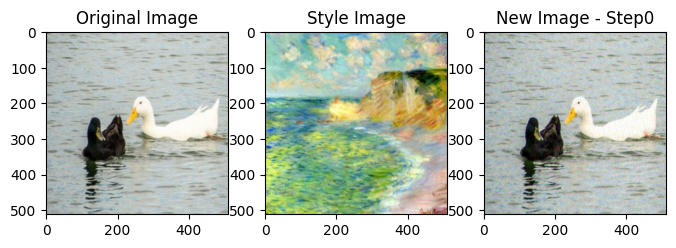

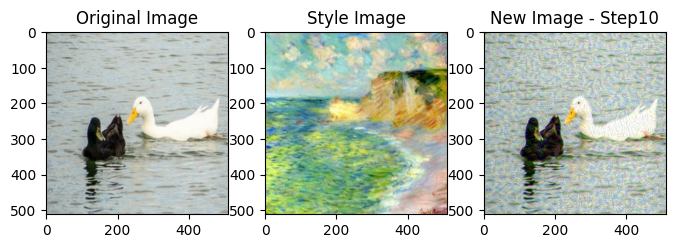

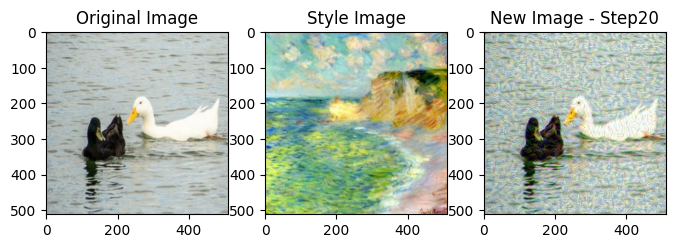

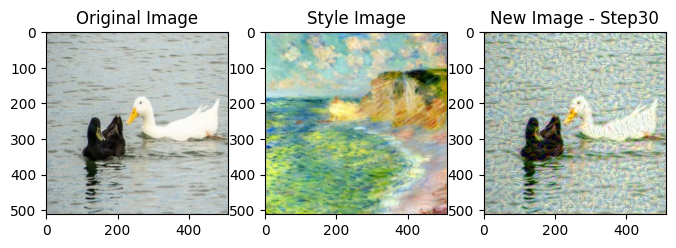

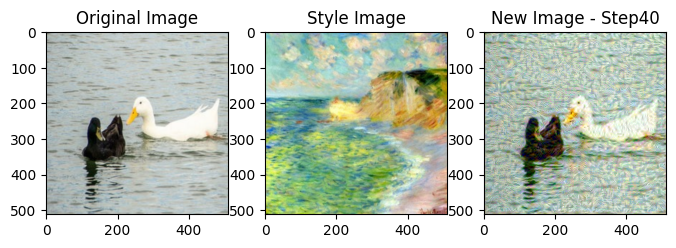

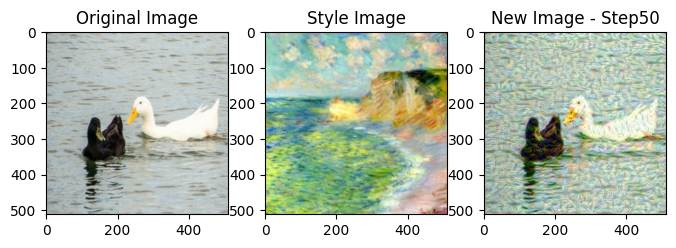

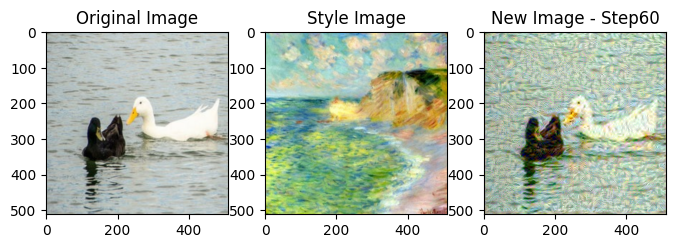

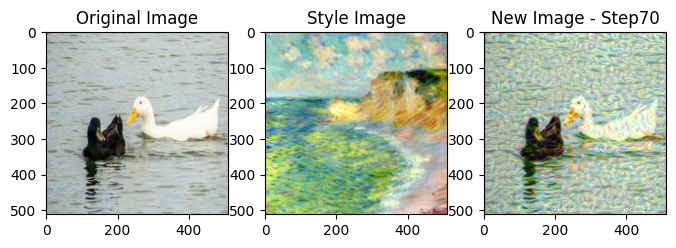

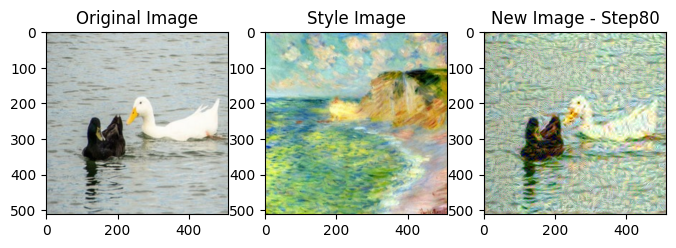

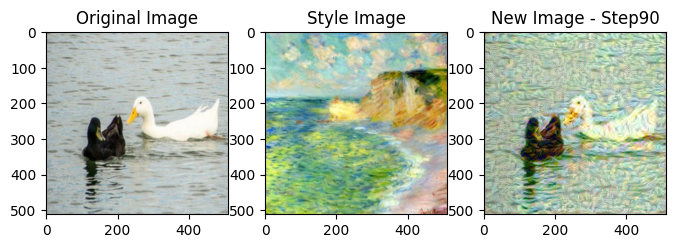

In [23]:
num_iterations=100 # Defines the number of iterations
for i in range(num_iterations):
    train_step(generate_image) # Perform one training iteration on the generated image generate_image
    if(i%10==0): # Visualisation is performed every 10 iterations
        plt.figure(figsize=(8,8))
        plt.subplot(1, 3, 1)
        imshow(content_img, 'Original Image')
        plt.subplot(1, 3, 2)
        imshow(style_img, 'Style Image')
        plt.subplot(1, 3, 3)
        imshow(np.squeeze(generate_image.read_value(), 0), 'New Image - Step'+str(i))

# Exploration1
Change the weights of the first convolutional layer of each convolutional block

In [24]:
style_weight=40
content_weight=10

# Custom weights for different style layers
style_weights = {'block1_conv1': 0.42,
                 'block2_conv1': 0.12,
                 'block3_conv1': 0.16,
                 'block4_conv1': 0.10,
                 'block5_conv1': 0.20}
# style_weights = {'block1_conv1': 0.3,
#                  'block2_conv1': 0.45,
#                  'block3_conv1': 0.15,
#                  'block4_conv1': 0.05,
#                  'block5_conv1': 0.05}

In [25]:
def total_cost(outputs):
    style_outputs=outputs['style']
    content_outputs=outputs['content']
    style_loss=tf.add_n([style_weights[name]*tf.reduce_mean((style_outputs[name]-style_targets[name])**2)
                        for name in style_outputs.keys()])
    style_loss*=style_weight/len(style_layers)# Normalize

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    content_loss*=content_weight/len(content_layers)
    loss=style_loss+content_loss
    return loss

In [26]:
# Define a tf.Variable to contain the image to optimize
generate_image = tf.Variable(content_img)
# Since this is a float image, define a function to keep the pixel values between 0 and 1
def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [27]:
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

In [28]:
@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = total_cost(outputs)

    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

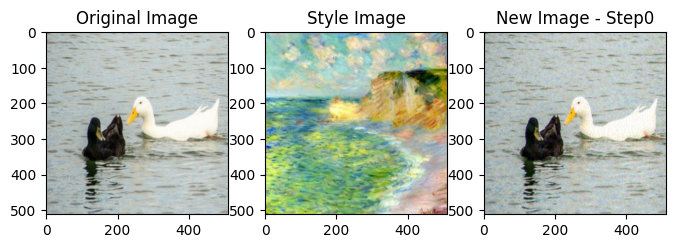

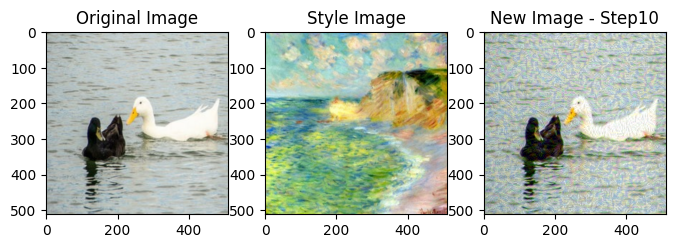

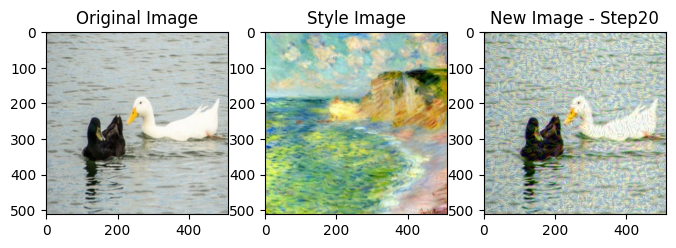

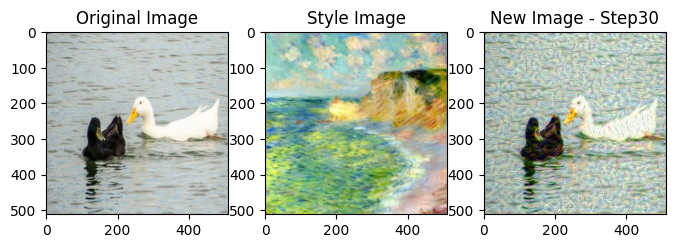

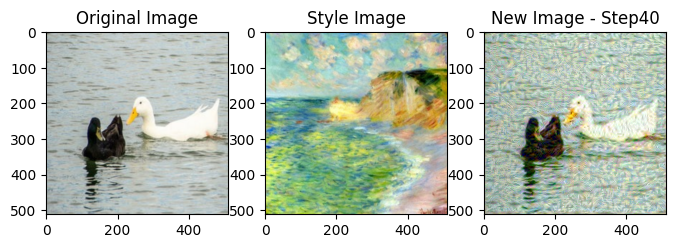

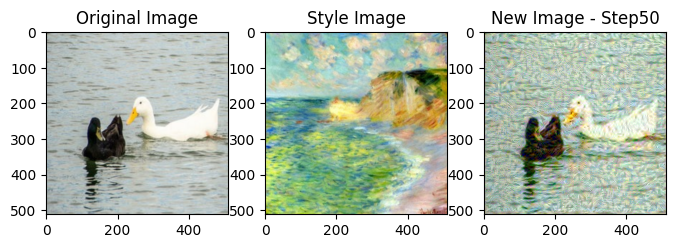

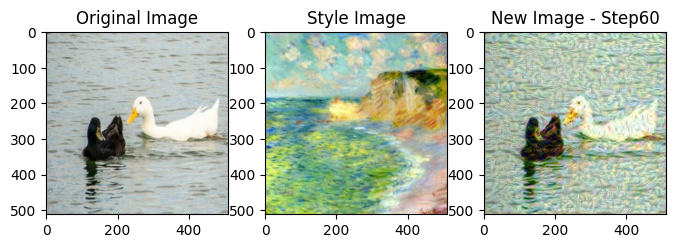

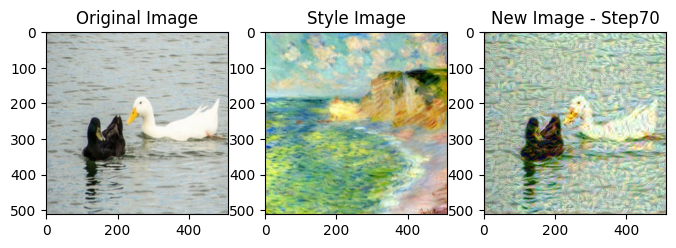

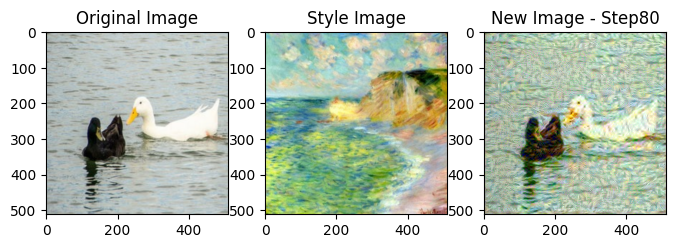

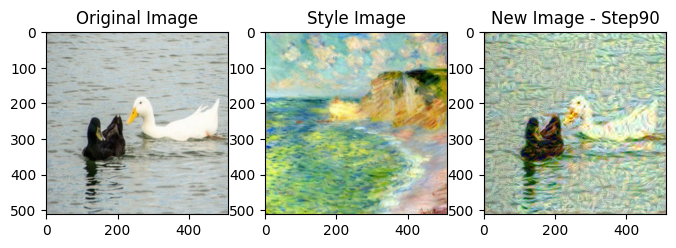

In [29]:
num_iterations=100
for i in range(num_iterations):
    train_step(generate_image)
    if(i%10==0):
        plt.figure(figsize=(8,8))
        plt.subplot(1, 3, 1)
        imshow(content_img, 'Original Image')
        plt.subplot(1, 3, 2)
        imshow(style_img, 'Style Image')
        plt.subplot(1, 3, 3)
        imshow(np.squeeze(generate_image.read_value(), 0), 'New Image - Step'+str(i))

# Exploration2
Changing the number of iterations

In [30]:
style_weight=40
content_weight=10

# Custom weights for different style layers
style_weights = {'block1_conv1': 0.4,
                 'block2_conv1': 0.15,
                 'block3_conv1': 0.25,
                 'block4_conv1': 0.15,
                 'block5_conv1': 0.05}
# style_weights = {'block1_conv1': 0.3,
#                  'block2_conv1': 0.45,
#                  'block3_conv1': 0.15,
#                  'block4_conv1': 0.05,
#                  'block5_conv1': 0.05}

In [31]:
def total_cost(outputs):
    style_outputs=outputs['style']
    content_outputs=outputs['content']
    style_loss=tf.add_n([style_weights[name]*tf.reduce_mean((style_outputs[name]-style_targets[name])**2)
                        for name in style_outputs.keys()])
    style_loss*=style_weight/len(style_layers)# Normalize

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    content_loss*=content_weight/len(content_layers)
    loss=style_loss+content_loss
    return loss

In [32]:
# Define a tf.Variable to contain the image to optimize
generate_image = tf.Variable(content_img)
# Since this is a float image, define a function to keep the pixel values between 0 and 1
def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [33]:
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

In [34]:
@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = total_cost(outputs)

    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

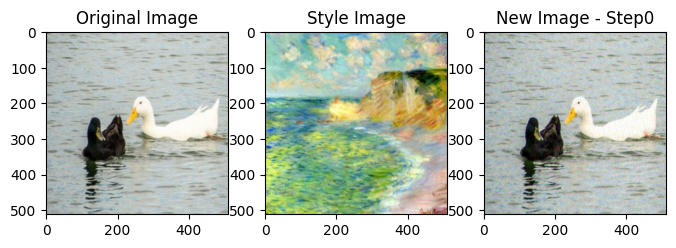

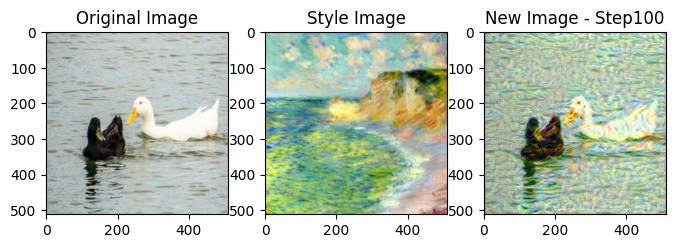

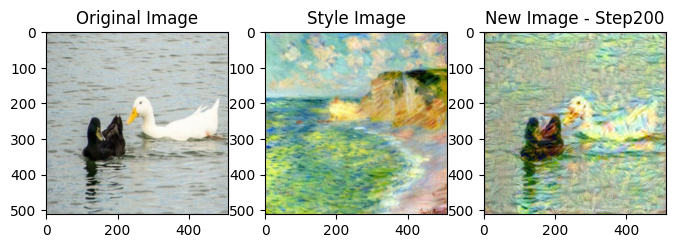

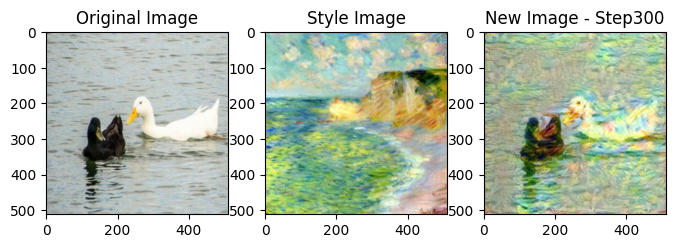

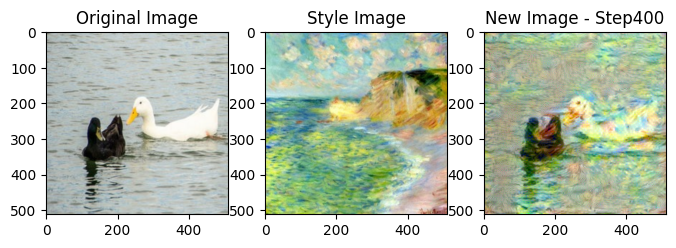

...

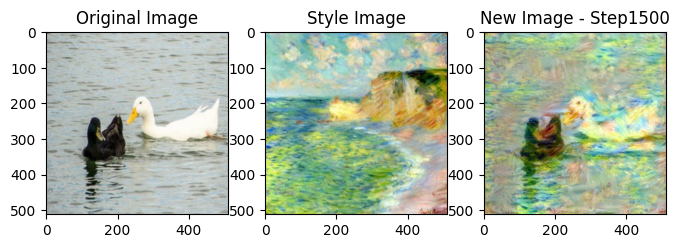

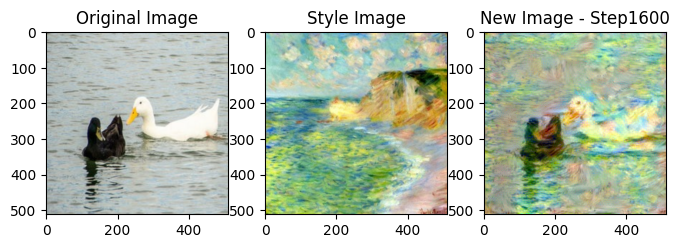

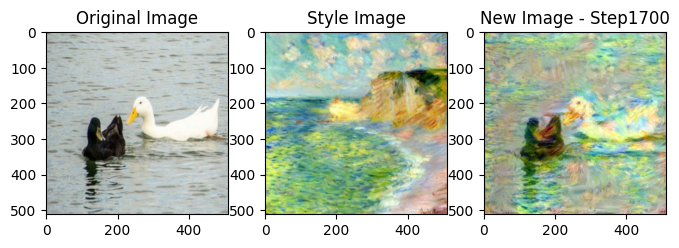

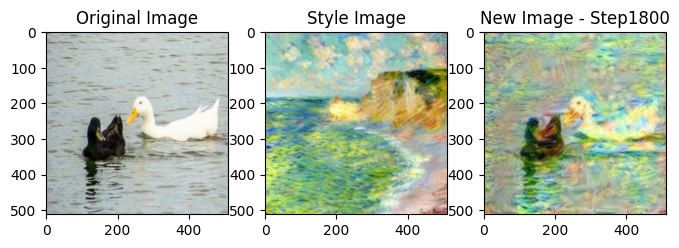

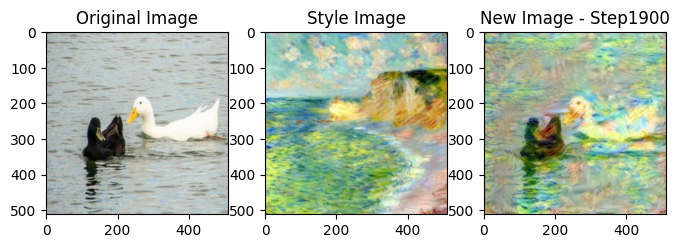

In [35]:
num_iterations=2000
for i in range(num_iterations):
    train_step(generate_image)
    if(i%100==0):
        plt.figure(figsize=(8,8))
        plt.subplot(1, 3, 1)
        imshow(content_img, 'Original Image')
        plt.subplot(1, 3, 2)
        imshow(style_img, 'Style Image')
        plt.subplot(1, 3, 3)
        imshow(np.squeeze(generate_image.read_value(), 0), 'New Image - Step'+str(i))